# Pix2Pix GAN for Image Translation

## What is Pix2Pix GAN?

- Pix2Pix is a Generative Adversarial Network (GAN) model designed for performing image-to-image translation on paired examples. For example, the model can be used to translate images of daytime to nighttime or from sketches of products like shoes to photographs of products. The benefit of the Pix2Pix model is that compared to other GANs for conditional image generation, it is relatively simple and capable of generating large high-quality images across a variety of image translation tasks.

- The approach was presented by [Phillip Isola](http://web.mit.edu/phillipi/), et al. in their 2016 paper titled “[Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/abs/1611.07004)” and presented at [CVPR](https://ieeexplore.ieee.org/abstract/document/8100115) in 2017.

- The GAN architecture is comprised of a generator model for outputting new plausible synthetic images and a discriminator model that classifies images as real (from the dataset) or fake (generated). The discriminator model is updated directly, whereas the generator model is updated via the discriminator model. As such the two models are trained simultaneously in an adversarial process where the generator seeks to better fool the discriminator and the discriminator seeks to better identify the counterfeit images.

- The Pix2Pix model is a type of conditional GAN (cGAN), where the generation of the output image is conditional on an input, in this case a source image. The discriminator is provided both with a source image and the target image and must determine whether the target is a plausible transformation of the source image.

- The generator is trained via adversarial loss, which encourages the generator to generate plausible images in the target domain. The generator is also updated via L1 loss measured between the generated image and the expected output image. This additional loss encourages the generator model to create plausible translations of the source image.

- The Pix2Pix GAN has been demonstrated on a range of image-to-image translation tasks such as converting maps to satellite photographs, black and white photographs to color and sketches of products to product photographs.

### Lets begin with the implementation of Pix2Pix GAN on Google Maps Dataset using Keras

## Check Google Colaboratory Jupyter Notebook Runtime Type and Load Necessary Libraries

In [0]:
# check if the Google Colaboratory Jupyter notebook is running on a GPU
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [0]:
# import necessary libraries
from os import scandir, path
from numpy import zeros, ones, load, asarray, savez_compressed, vstack
from numpy.random import randint
import matplotlib.pyplot as plt
from keras.preprocessing.image import img_to_array, load_img
from keras.models import Model, Input, load_model
from keras.layers.core import Activation, Dropout 
from keras.layers.advanced_activations import LeakyReLU 
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.merge import Concatenate
from keras.layers.normalization import BatchNormalization
from keras.optimizers import Adam
from keras.utils.vis_utils import plot_model
from keras.utils.data_utils import get_file
from keras.initializers import RandomNormal
from IPython.display import Image
import time

## Prepare and Explore Satellite to Map Image Translation Dataset

- This is a dataset comprised of satellite images of New York and their corresponding Google maps images. The image translation problem involves converting satellite photos to Google maps format or vice versa.

- The dataset can be downloaded from [here](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz)

- The train folder contains 1,097 images, whereas the validation dataset contains 1,099 images.

- Images have a digit filename and are in JPEG format. Each image is 1,200 pixels wide and 600 pixels tall and contains both the satellite image on the left and the Google maps image on the right.

![Image](2.jpg)

### Load and Prepare Dataset

- We have to manipulate our map dataset for training a Pix2Pix GAN model in Keras. We will just work with the images in the training dataset. Each image will be loaded, rescaled and split into the satellite and Google map elements. The result will be 1,096 color image pairs with the width and height of 256×256 pixels.

- The load_images( ) function below implements this. It enumerates the list of images in a given directory, loads each with the target size of 256×512 pixels, splits each image into satellite and map elements and returns an array of each. We can call this function with the path to the training dataset. Once loaded, we can save the prepared arrays to a new file in compressed format for later use.

In [0]:
# mount google drive
#from google.colab import drive
#drive.mount('/content/drive')

In [0]:
# calculate execution time
%%time

# load, split and scale the maps dataset for training
def load_images(path, size=(256, 512)):
    src_list, tar_list = list(), list()
    # enumerate filename in directory, assume all are images
    with scandir(path) as entries:
        for filename in entries:
            if filename.is_file():
                # load and resize the image
                pixels = load_img(path + filename.name, target_size=size)
                # convert to numpy array
                pixels = img_to_array(pixels)
                # split into satellite and map
                sat_img, map_img = pixels[:, :256], pixels[:, 256:]
                src_list.append(sat_img)
                tar_list.append(map_img)
    return [asarray(src_list), asarray(tar_list)]

# dataset url
URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/maps.tar.gz'
# get dataset and extract
path_to_zip = get_file('maps.tar.gz', origin=URL, extract=True)
print(f'Path to zip: {path_to_zip}')
# join directory and path
path = path.join(path.dirname(path_to_zip), 'maps/train/')
print(f'Path: {path}')
# load dataset
[src_images, tar_images] = load_images(path)
print(f'Loaded Source Images:{src_images.shape}; Target Images:{tar_images.shape}')
# save as compressed numpy array
#filename = '/content/drive/My Drive/path_to_google_drive/maps_512.npz'
#savez_compressed(filename, src_images, tar_images)
#print(f'Saved dataset: {filename}')

Path to zip: /root/.keras/datasets/maps.tar.gz
Path: /root/.keras/datasets/maps/train/
Loaded Source Images:(1096, 256, 256, 3); Target Images:(1096, 256, 256, 3)
CPU times: user 14.2 s, sys: 3.28 s, total: 17.5 s
Wall time: 17.5 s


In [0]:
# calculate execution time
#%%time

# load prepared dataset from google drive
#data = load('/content/drive/My Drive/path_to_google_drive/')
#src_images, tar_images = data['arr_0'], data['arr_1']
#print(f'Loaded Source Images:{src_images.shape}; Target Images:{tar_images.shape}')

### Explore the Images
- We can plot some image pairs to confirm the data has been handled correctly.

- A plot of three image pairs is created showing the satellite images on top and Google map images at bottom.

- We can see that satellite images are quite complex and that although the Google map images are much simpler, they have color codings for things like major roads, water and parks.

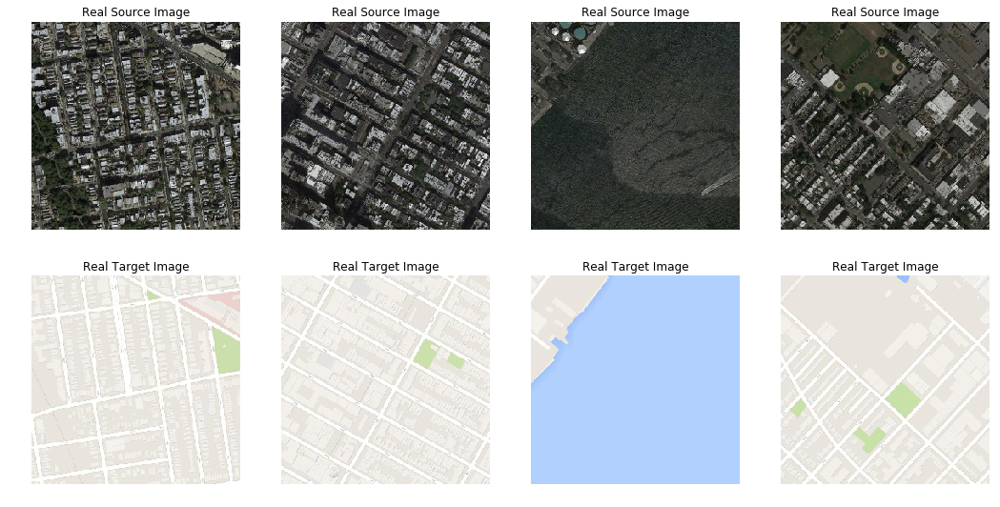

In [0]:
# plot dataset images
# number of samples
n_samples = 4
# set plot size
plt.figure(figsize=(18,9))

# plot source images
for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + i)
    plt.title("Real Source Image")
    plt.imshow(src_images[i].astype('uint8'))
    plt.axis('off')
    
# plot target images
for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + n_samples + i)
    plt.title("Real Target Image")
    plt.imshow(tar_images[i].astype('uint8'))
    plt.axis('off')
    
plt.show()

## U-Net Generator Model

- The generator model for Pix2Pix GAN is implemented as a U-Net. The U-Net model is an encoder-decoder model for image translation where skip connections are used to connect layers in the encoder with corresponding layers in the decoder that have the same sized feature maps. The U-Net Generator model takes an image from source domain (e.g. Satellite image) and generates an image in target domain (e.g. Google Maps image).

    > __Input__ :- Image from source domain

    > __Output__ :- Image in target domain

- The encoder part of the model is comprised of convolutional layers that use a 2×2 stride to downsample the input source image down to a bottleneck layer. The decoder part of the model reads the bottleneck output and uses transpose convolutional layers to upsample to the required output image size.

- Skip connections are added between the layers with the same sized feature maps so that the first downsampling layer is connected with the last upsampling layer, the second downsampling layer is connected with the second last upsampling layer and so on. The connections join the channels of the feature map in the downsampling layer with the feature map in the upsampling layer.

![Depiction-of-the-Encoder-Decoder-Generator-and-U-Net-Generator-Models](Depiction-of-the-Encoder-Decoder-Generator-and-U-Net-Generator-Models.jpg)


- The architecture of the U-Net model is defined using the shorthand notation as:

    > __Encoder__ :- C64 - C128 - C256 - C512 - C512 - C512 - C512 - C512

    > __Decoder__ :- CD512 - CD512 - CD512 - C512 - C256 - C128 - C64

- Unlike traditional generator models in the GAN architecture, the U-Net generator does not take a point from the latent space as input. Instead, dropout layers are used as a source of randomness both during training and when the model is used to make a prediction.

- Similarly, batch normalization is used in the same way during training and inference, meaning that statistics are calculated for each batch and not fixed at the end of the training process. This is referred to as instance normalization specifically when the batch size is set to 1 as it is with the Pix2Pix model.

- In Keras, layers like Dropout and BatchNormalization operate differently during training and in inference model. We can set the "training" argument when calling these layers to "True" to ensure that they always operate in training-model even when used during inference. For example, a Dropout layer that will drop out during inference as well as training can be added to the model as follows: g = Dropout(0.5)(g, training=True)

- The encoder uses blocks of Convolution-BatchNorm-LeakyReLU like the discriminator model, whereas the decoder model uses blocks of Convolution-BatchNorm-Dropout-ReLU with a dropout rate of 50%. All convolutional layers use a filter size of 4×4 and a stride of 2×2. Batch normalization is not used in the first layer of the encoder.

- The last layer of the encoder is the bottleneck layer which does not use batch normalization and uses a ReLU activation instead of LeakyReLU. The output of the model uses a single convolutional layer with three channels and tanh activation function is used in the output layer, meaning that pixel values in the generated image will be in the range [-1,1].

- Tying this all together we can define a function build_generator( ) that defines the U-Net encoder-decoder generator model. Two helper functions are also provided for defining encoder and decoder blocks of layers.

In [0]:
# define encoder block
def encoder(input_layer, n_filters, batchnorm=True):
    # initialize Gaussian Weight
    init = RandomNormal(mean=0.0, stddev=0.02)
    # downsampling layer
    e = Conv2D(n_filters, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(input_layer)
    # conditionally add batch normalization
    if batchnorm:
        e = BatchNormalization()(e, training=True)
    # Leaky ReLU activation
    e = LeakyReLU(alpha=0.2)(e)
    return e

# define decoder block
def decoder(input_layer, skip_in, n_filters, dropout=True):
    # initialize Gaussian Weight
    init = RandomNormal(mean=0.0, stddev=0.02)
    # upsampling layer
    d = Conv2DTranspose(n_filters, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(input_layer)
    # batch normalization
    d = BatchNormalization()(d, training=True)
    # conditionally add dropout
    if dropout:
        d = Dropout(0.5)(d, training=True)
    # merge with skip connection
    d = Concatenate()([d, skip_in])
    # relu activation
    d = Activation('relu')(d)
    return d

# define generator model
def build_generator(image_shape=(256,256,3)):
    # initialize Gaussian Weight
    init = RandomNormal(mean=0.0, stddev=0.02)
    # input image
    input_image = Input(shape=image_shape)
    # encoder model
    e1 = encoder(input_image, 64, batchnorm=False)
    e2 = encoder(e1, 128)
    e3 = encoder(e2, 256)
    e4 = encoder(e3, 512)
    e5 = encoder(e4, 512)
    e6 = encoder(e5, 512)
    e7 = encoder(e6, 512)
    #e8 = encoder(e7, 512)
    # bottleneck, no batch and relu
    b = Conv2D(filters=512, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)
    # decoder model
    #d1 = decoder(b, e8, 512)
    d1 = decoder(b, e7, 512)
    d2 = decoder(d1, e6, 512)
    d3 = decoder(d2, e5, 512)
    d4 = decoder(d3, e4, 512, dropout=False)
    d5 = decoder(d4, e3, 256, dropout=False)
    d6 = decoder(d5, e2, 128, dropout=False)
    d7 = decoder(d6, e1, 64, dropout=False)
    # output
    gen = Conv2DTranspose(3, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    output_image = Activation('tanh')(gen)
    # define model
    model = Model(input_image, output_image)
    return model
    
# create generator model
g_model = build_generator()











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


### U-Net Generator Model Summary

In [0]:
# U-Net Generator model summary
g_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 64) 3136        input_1[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_1 (LeakyReLU)       (None, 128, 128, 64) 0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 64, 64, 128)  131200      leaky_re_lu_1[0][0]              
____________________________________________________________________________________________

### Plot U-Net Generator Model

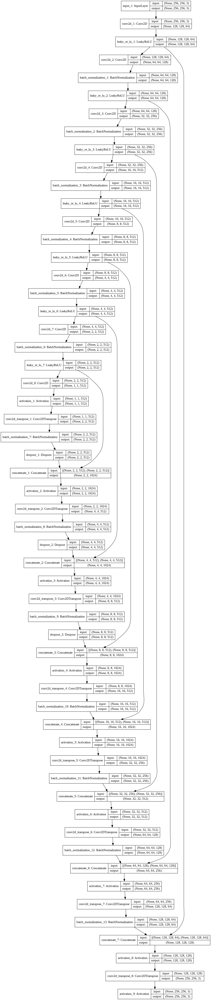

In [0]:
# plot U-Net Generator model
plot_model(g_model, to_file='p2p_generator_model_plot.png', show_shapes=True, show_layer_names=True)
Image(filename='p2p_generator_model_plot.png', retina=True)

## PatchGAN Discriminator Model

- The discriminator is a deep convolutional neural network that performs image classification, specifically conditional image classification. It takes both the source image (e.g. satellite photo) and the target image (e.g. Google maps image) as input and predicts the likelihood of whether target image is real or a fake translation of the source image.

    > __Input__ :- Image from source domain and Image from target domain.

    > __Output__ :- Probability that the image from the target domain is a real translation of the source image.

- The discriminator design is based on the effective receptive field of the model which defines the relationship between one output of the model to the number of pixels in the input image. This is called a PatchGAN model and is carefully designed so that each output prediction of the model maps to a 70×70 square or patch of the input image. The benefit of this approach is that the same model can be applied to input images of different sizes, e.g. larger or smaller than 256×256 pixels.

- __PatchGAN__

    - The discriminator model in the Pix2Pix GAN is implemented as a PatchGAN. The PatchGAN is designed based on the size of the receptive field, sometimes called the effective receptive field. The receptive field is the relationship between one output activation of the model to an area on the input image (actually volume as it proceeded down the input channels).
    
    - The receptive field is not the size of the output of the discriminator model, e.g. it does not refer to the shape of the activation map output by the model. It is a definition of the model in terms of one pixel in the output activation map to the input image. The output of the model may be a single value or a square activation map of values that predict whether each patch of the input image is real or fake.
    
    - Traditionally, the receptive field refers to the size of the activation map of a single convolutional layer with regards to the input of the layer, the size of the filter and the size of the stride. The effective receptive field generalizes this idea and calculates the receptive field for the output of a stack of convolutional layers with regard to the raw image input. The terms are often used interchangeably.

    - A PatchGAN with the size 70×70 is used, which means that the output (or each output) of the model maps to a 70×70 square of the input image. In effect, a 70×70 PatchGAN will classify 70×70 patches of the input image as real or fake.
    
    - The authors of the Pix2Pix GAN provide a Matlab script to calculate the effective receptive field size for different model configurations in a script called receptive_field_sizes.m. It can be helpful to work through an example for the 70×70 PatchGAN receptive field calculation.
    
    - The 70×70 PatchGAN has a fixed number of three layers (excluding the output and second last layers), regardless of the size of the input image. The calculation of the receptive field in one dimension is calculated as:

    > receptive field = (output size – 1) * stride + kernel size

    - Where output size is the size of the prior layers activation map, stride is the number of pixels the filter is moved when applied to the activation and kernel size is the size of the filter to be applied.
    
    - The PatchGAN uses a fixed stride of 2×2 (except in the output and second last layers) and a fixed kernel size of 4×4. We can, therefore, calculate the receptive field size starting with one pixel in the output of the model and working backward to the input image.
    
    - We can develop a Python function called receptive_field( ) to calculate the receptive field, then calculate and print the receptive field for each layer in the Pix2Pix PatchGAN model. The complete example is listed below.

    ```
    # example of calculating the receptive field for the PatchGAN
    def receptive_field(output_size, kernel_size, stride_size):
        return (output_size - 1) * stride_size + kernel_size
    
    # output layer 1x1 pixel with 4x4 kernel and 1x1 stride
    rf = receptive_field(1, 4, 1)
    print(rf)  -->  4
    # second last layer with 4x4 kernel and 1x1 stride
    rf = receptive_field(rf, 4, 1)
    print(rf)  -->  7
    # 3 PatchGAN layers with 4x4 kernel and 2x2 stride
    rf = receptive_field(rf, 4, 2)
    print(rf)  -->  16
    rf = receptive_field(rf, 4, 2)
    print(rf)  -->  34
    rf = receptive_field(rf, 4, 2)
    print(rf)  -->  70

    ```
    - We can see that each 1×1 pixel in the output layer maps to a 70×70 receptive field in the input layer.
    
    - The authors of the Pix2Pix paper explore different PatchGAN configurations including a 1×1 receptive field called a PixelGAN and a receptive field that matches the 256×256 pixel images input to the model (resampled to 286×286) called an ImageGAN. They found that the 70×70 PatchGAN resulted in the best trade-off of performance and image quality.

- The model takes two images as input specifically a source and a target image. These images are concatenated together at the channel level, e.g. 3 color channels of each image become 6 channels of the input.

- Model weights were initialized via random Gaussian with a mean of 0.0 and standard deviation of 0.02. Images input to the model are 256×256.

- The PatchGAN configuration is defined using a shorthand notation as: C64 - C128 - C256 - C512, where C refers to a block of Convolution-BatchNorm-LeakyReLU layers and the number indicates the number of filters. Batch normalization is not used in the first layer. As mentioned, the kernel size is fixed at 4×4 and a stride of 2×2 is used on all but the last 2 layers of the model. The slope of the LeakyReLU is set to 0.2 and a sigmoid activation function is used in the output layer.

- The model is trained with a batch size of one image and the Adam version of stochastic gradient descent is used with a small learning range and modest momentum. The loss for the discriminator is optimized using binary cross entropy and a weighting is used so that updates to the model have half (0.5) the usual effect. The authors of Pix2Pix recommend this weighting of model updates to slow down changes to the discriminator relative to the generator model during training. Tying this all together, we can define a function named build_discriminator( ) that creates the 70×70 PatchGAN discriminator model.

- The output of the model depends on the size of the input image but may be one value or a square activation map of values. Each value is a probability for the likelihood that a patch in the input image is real. These values can be averaged to give an overall likelihood or classification score if needed.

In [0]:
# define PatchGAN discriminator model
def build_discriminator(image_shape=(256,256,3)):
    # initialize Gaussian Weight
    init = RandomNormal(mean=0.0, stddev=0.02)
    # source image input
    input_src_image = Input(shape=image_shape)
    # target image input
    input_target_image = Input(shape=image_shape)
    # concatenate images channel-wise
    merged = Concatenate()([input_src_image, input_target_image])
    
    # C64 --> input source and target images and downsample from 256x256 to 128x128
    dis = Conv2D(filters=64, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
    dis = LeakyReLU(alpha=0.2)(dis)
    
    # C128 --> downsample from 128x128 to 64x64
    dis = Conv2D(filters=128, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(dis)
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)

    # C256 --> downsample from 64x64 to 32x32
    dis = Conv2D(filters=256, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(dis)
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
    
    # C256 --> downsample from 64x64 to 32x32
    #dis = Conv2D(filters=256, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(dis)
    #dis = BatchNormalization()(dis)
    #dis = LeakyReLU(alpha=0.2)(dis)
    
    # C512 --> downsample from 32x32 to 16x16
    dis = Conv2D(filters=512, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=init)(dis)
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
    
    # 2D Convolution Layer
    dis = Conv2D(filters=512, kernel_size=(4,4), padding='same', kernel_initializer=init)(dis)
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
    
    # patch output
    dis = Conv2D(1, kernel_size=(4,4), padding='same', kernel_initializer=init)(dis)
    patch_output = Activation('sigmoid')(dis)
    
    # define model
    model = Model([input_src_image, input_target_image], patch_output)
    
    # compile and slow down model by 50%
    model.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.0002, beta_1=0.5), loss_weights = [0.5])
    return model

# create the discriminator
d_model = build_discriminator()




Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


### PatchGAN Discriminator Model Summary

In [0]:
# PatchGAN Discriminator model summary
d_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
concatenate_8 (Concatenate)     (None, 256, 256, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 128, 128, 64) 6208        concatenate_8[0][0]        

- The summary of the PatchGAN Discriminator model provides an insight into how the input shape is transformed across the layers and the number of parameters in the model. We can see that the two input images are concatenated together to create one 256x256x6 input to the first hidden convolutional layer

- We can see that the model output will be an activation map with the size 16×16 pixels or activations and a single channel with each value in the map corresponding to a 70×70 pixel patch of the input 256×256 image. If the input image was half the size at 128×128, then the output feature map would also be halved to 8×8.

- The model is a binary classification model, meaning it predicts an output as a probability in the range [0,1], in this case the likelihood of whether the input image is real or fake translation of the source image. The patch of values can be averaged to give a real/fake prediction by the model. When trained, the target is compared to a matrix of target values 0 for fake and 1 for real.

### Plot PatchGAN Discriminator Model

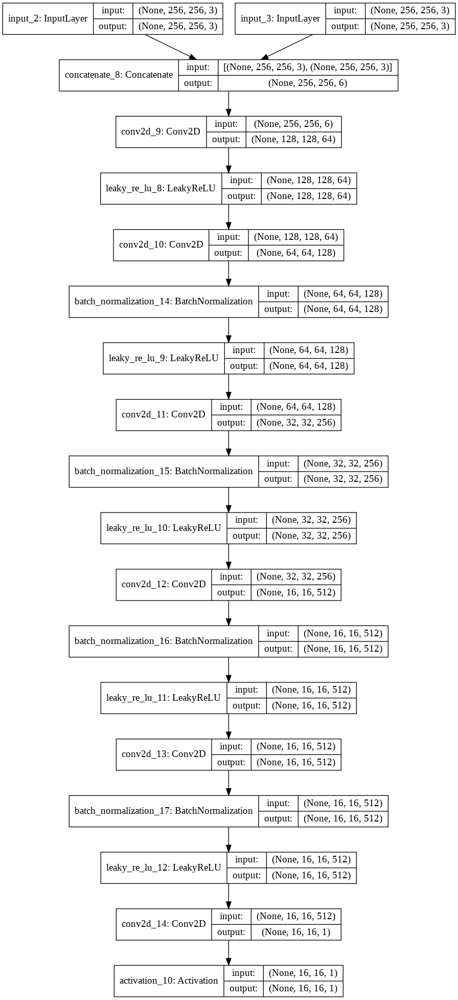

In [0]:
# plot PatchGAN discriminator model
plot_model(d_model, to_file='p2p_discriminator_model_plot.png', show_shapes=True, show_layer_names=True)
Image(retina=True, filename='p2p_discriminator_model_plot.png')

## How to Implement Adversarial and L1 Loss?

### What Are L1 and L2 Loss Functions?

- L1 and L2 are two loss functions in machine learning which are used to minimize the error. L1 Loss function stands for Least Absolute Deviations (LAD). L2 Loss function stands for Least Square Errors (LS).

    - __L1 Loss Function__ :- It is used to minimize the error which is the sum of the all the absolute differences between the true value and the predicted value.
    
    > ![l1-loss-function](l1-loss-function.png)
    
    - __L2 Loss Function__ :- It is used to minimize the error which is the sum of the all the squared differences between the true value and the predicted value.
    
    > ![l2-loss-function](l2-loss-function.png)

- __How to decide between L1 and L2 Loss Function?__

    - Generally, L2 Loss Function is preferred in most of the cases. But when the outliers are present in the dataset, then L2 Loss Function does not perform well. The reason behind this bad performance is that if the dataset is having outliers, then because of the consideration of the squared differences, it leads to the much larger error. Hence, L2 Loss Function is not useful here. Prefer L1 Loss Function as it is not affected by the outliers or remove the outliers and then use L2 Loss Function.

### Composite Adversarial and L1 Loss

- The discriminator model is trained in a standalone manner in the same way as a traditional GAN model, minimizing the negative log likelihood of identifying real and fake images, although conditioned on a source image.

- The training of the discriminator is too fast compared to the generator, therefore the discriminator loss is halved in order to slow down the training process.

    > Discriminator Loss = 0.5 * Discriminator Loss

- The generator model is trained using both the adversarial loss for the discriminator model and the L1 or mean absolute pixel difference between the generated translation of the source image and the expected target image.

- The adversarial loss and the L1 loss are combined into a composite loss function, which is used to update the generator model. L2 loss was also evaluated and found to result in blurry images.

- __The adversarial loss influences whether the generator model can output images that are plausible in the target domain, whereas the L1 loss regularizes the generator model to output images that are a plausible translation of the source image.__ As such, the combination of the L1 loss to the adversarial loss is controlled by a new hyperparameter lambda, which is set to 10, e.g. giving 10 times the importance of the L1 loss than the adversarial loss to the generator during training.

    > Generator Loss = Adversarial Loss + Lambda * L1 Loss
    
### Insight into Pix2Pix Architectural Choices

#### Analysis of Loss Function

- Experiments are performed to compare different loss functions used to train the generator model. These included only using the L1 loss, only the conditional adversarial loss, only using unconditional adversarial loss and combinations of L1 with each adversarial loss.

- The results were interesting, showing that L1 and conditional adversarial loss alone can generate reasonable images, although the L1 images were blurry and the cGAN images introduced artifacts. The combination of the two gave the clearest results.

    ![Generated-Images-Using-L1-Conditional-Adversarial-cGAN-and-Composite-Loss-Functions](Generated-Images-Using-L1-Conditional-Adversarial-cGAN-and-Composite-Loss-Functions.jpg)

#### Analysis of Generator Model

- The U-Net generator model architecture was compared to a more common encoder-decoder generator model architecture. Both approaches were compared with just L1 loss and L1 + conditional adversarial loss, showing that the encoder-decoder was able to generate images in both cases, but the images were much sharper when using the U-Net architecture.

    ![Generated-Images-Using-the-Encoder-Decoder-and-U-Net-Generator-Models-Under-Different-Loss](Generated-Images-Using-the-Encoder-Decoder-and-U-Net-Generator-Models-Under-Different-Loss.jpg)
    
#### Analysis of Discriminator Model

- Experiments were performed comparing the PatchGAN discriminator with different sized effective receptive fields. Versions of the model were tested from a 1×1 receptive field or PixelGAN through to a full-sized 256×256 or ImageGAN, as well as smaller 16×16 and 70×70 PatchGANs.

- The larger the receptive field, the deeper the network. This means that the 1×1 PixelGAN is the shallowest model and the 256×256 ImageGAN is the deepest model. The results showed that very small receptive fields can generate effective images, although the full sized ImageGAN provides crisper results but is harder to train. Using a smaller 70×70 receptive field provided a good trade-off of performance (model depth) and image quality.

    ![Generated-Images-Using-PatchGANs-with-Different-Sized-Receptive-Fields](Generated-Images-Using-PatchGANs-with-Different-Sized-Receptive-Fields.jpg)

## Build GAN Model

- The discriminator model is trained directly on real and generated images whereas the generator model is not. Instead, the generator model is trained via the discriminator model. It is updated to minimize the loss predicted by the discriminator for generated images marked as "real". As such, it is encouraged to generate more real images. The generator is also updated to minimize the L1 loss or mean absolute error between the generated image and the target image.

- The generator is updated via a weighted sum of both the adversarial loss and the L1 loss, where the authors of the model recommend a weighting of 100 to 1 in favor of the L1 loss. This is to encourage the generator towards generating plausible translations of the input image and not just plausible images in the target domain.

- This can be achieved by defining a new logical model comprised of the weights in the existing standalone generator and discriminator model. This logical or composite model involves stacking the generator on top of the discriminator. A source image is provided as input to the generator and to the discriminator, although the output of the generator is connected to the discriminator as the corresponding "target" image. The discriminator then predicts the likelihood that the generator's image was a real translation of the source image.

- The discriminator is updated in a standalone manner so the weights are reused in this composite model but are marked as not trainable. The composite model is updated with two targets, one indicating that the generated images were real (cross entropy loss), forcing large weight updates in the generator towards generating more realistic images and the executed real translation of the image which is compared against the output of the generator model (L1 loss).

- The build_gan( ) function below implements this, taking the already defined generator and discriminator models as arguments and using the Keras functional API to connect them together into a composite model. Both loss functions are specified for the two outputs of the model and the weights used for each are specified in the loss_weights argument to the compile( ) function.


In [0]:
# define combined generator and discriminator model
def build_gan(g_model, d_model, image_shape=(256,256,3)):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # define source image
    src_input = Input(shape=image_shape)
    # connect the source image to the generator input
    gen_out = g_model(src_input)
    # connect the source image and generator output as input to the discrimnator
    dis_out = d_model([src_input, gen_out])
    # define logical GAN model taking source image as input, generating image and outputting classification
    model = Model(src_input, [dis_out, gen_out])
    # compile model
    model.compile(loss=['binary_crossentropy', 'mae'], optimizer=Adam(lr=0.0002, beta_1=0.5), loss_weights=[1,100])
    return model

# create logical GAN model
gan_model = build_gan(g_model, d_model)

### GAN Model Summary

In [0]:
# GAN model summary
gan_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 256, 256, 3)  54429315    input_4[0][0]                    
__________________________________________________________________________________________________
model_2 (Model)                 (None, 16, 16, 1)    6968257     input_4[0][0]                    
                                                                 model_1[1][0]                    
Total params: 61,397,572
Trainable params: 54,419,459
Non-trainable params: 6,978,113
__________________________________________________________________________________________________


### Plot GAN Model

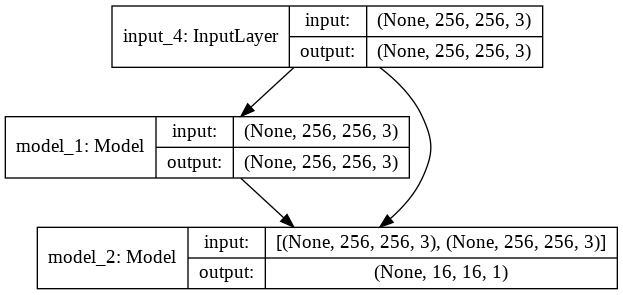

In [0]:
# plot GAN model
plot_model(gan_model, to_file='p2pgan_plot.png', show_shapes=True, show_layer_names=True)
Image(retina=True, filename='p2pgan_plot.png')

## Prepare Dataset

- The load_real_images( ) function below takes source and target images, scales it to [-1,1] before returning it.

In [0]:
# load and prepare training images
def load_real_images(src_images, tar_images):
    # load compressed arrays
    #data = load(filename)
    # unpack arrays
    #real_image, real_target = data['arr_0'], data['arr_1']
    # scale images from [0,255] to [-1,1]
    real_image = (src_images - 127.5) / 127.5
    real_target = (tar_images - 127.5) / 127.5
    return [real_image, real_target]

## Get Random Real Image Samples

- Training the discriminator will require batches of real and fake images. The get_real_images( ) function below will prepare a batch of random pairs of images from the training dataset and the corresponding discriminator label of class=1 to indicate they are real.

In [0]:
# get a batch of random samples
def get_real_images(dataset, n_samples, patch_shape):
    # unpack dataset
    real_image, real_target = dataset
    # choose random instances
    ix = randint(0, real_image.shape[0], n_samples)
    # retrieve selected images
    real_image, real_target = real_image[ix], real_target[ix]
    # generate 'real' class labels (1)
    real_label = ones((n_samples, patch_shape, patch_shape, 1))
    return [real_image, real_target], real_label

## Generate Translated Images

- The generate_translated_images( ) function below uses the generator model and a batch of real source images to generate an equivalent batch of target images for the discriminator. These are returned with the label class 0 to indicate to the discriminator that they are fake.

In [0]:
# generate translated images
def generate_translated_images(g_model, samples, patch_shape):
    # generate translated images
    translated_image = g_model.predict(samples)
    # create 'fake' class labels (0)
    translated_label = zeros((len(translated_image), patch_shape, patch_shape, 1))
    return translated_image, translated_label

## Plot Translated Images

- The plot_images( ) function below plots three rows of real source image, real target image and translated image for every 10 epochs by scaling all pixels from [-1,1] to [0,1] and saving the plot to a file.

In [0]:
# plot translated images
def plot_images(epoch, real_image, real_target, translated_image, n_samples):
    # scale all pixels from [-1,1] to [0,1]
    real_image = (real_image + 1) / 2.0
    translated_image = (translated_image + 1) / 2.0
    real_target = (real_target + 1) / 2.0
    
    # set plot size
    plt.figure(figsize=(18,14))
    
    # plot real source images
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + i)
        plt.axis('off')
        plt.title("Real Image")
        plt.imshow(real_image[i])
        
    # plot real target images
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples + i)
        plt.axis('off')
        plt.title("Real Target Image")
        plt.imshow(real_target[i])
        
    # plot translated images
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples*2 + i)
        plt.axis('off')
        plt.title("Translated Image")
        plt.imshow(translated_image[i])
        
    # save plot to file
    plt.savefig('plot_at_epoch_{:04d}.png'.format(epoch+1))
    # show images
    plt.show()

## Summarize Performance

- Typically GAN models do not converge, instead an equilibrium is found between the generator and discriminator models. As such, we cannot easily judge when training should stop. Therefore, we can save the model and use it to generate sample image-to-image translations periodically during training such as every 10 training epochs. We can then review the generated images at the end of training and use the image quality to choose a final model.

- The summarize_performance( ) function below implements this by taking the generator model at a point during training and uses it to generate a number (in this case four) of translations of randomly selected images in the dataset. Generator and Discriminator Loss is summarized every 10 training epochs. The real source image, real target image and translated image are then plotted as three rows of images and the plot saved to a file. Additionally, the model is saved in H5 formatted file that makes it easier to load later. Both the image and model filenames include the training iteration number allowing us to easily tell them apart at the end of training.

In [0]:
# report discriminator and generator loss, plot translated images and save generator model
def summarize_performance(epoch, d_loss_real, d_loss_translated, g_loss, dataset, g_model, n_samples=4):
    # print epoch
    print(f'Epoch --> {epoch + 1}')
    # print Discriminator and Generator Loss
    print(f"Discriminator's Loss on Real: {d_loss_real:.4f} and Translated: {d_loss_translated:.4f} Images")
    print(f"Generator's Loss: {g_loss:.4f}")
    
    # select a random sample of input images
    [real_image, real_target], _ = get_real_images(dataset, n_samples, 1)
    # translate a batch of images
    translated_image, _ = generate_translated_images(g_model, real_image, 1)
    
    # plot and save real, target and translated images
    plot_images(epoch, real_image, real_target, translated_image, n_samples)
    
    # save the generator model
    filename = 'p2pgan_generator_model_at_epoch_%03d.h5' % (epoch+1)
    g_model.save(filename)

## Plot Discriminator and Generator Loss

- The plot_history( ) function below plots the Discriminator's Loss on Real Images, Discriminator's Loss on Translated Images and Generator Loss.

In [0]:
# plot Discriminator and Generator Loss
def plot_history(d_loss_real_hist, d_loss_translated_hist, g_loss_hist):
    plt.figure(figsize=(14,8))
    
    # plot Discriminator Loss
    plt.subplot(2, 1, 1)
    plt.plot(d_loss_real_hist, label="Discriminator's Loss on Real Images")
    plt.plot(d_loss_translated_hist, label="Discriminator's Loss on Translated Images")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.title("Discriminator's Loss on Real and Translated Images")
    plt.legend()

    # plot Generator Loss
    plt.subplot(2, 1, 2)
    plt.plot(g_loss_hist, label="Generator's Loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.title("Generator's Loss")
    plt.legend()
    
    plt.tight_layout()
    plt.show()

## Train Pix2Pix GAN Model

- Finally, we can train the generator and discriminator models. The train_gan( ) function below implements this taking the defined generator, discriminator, composite model and loaded dataset as input. The number of epochs is set at 100 to keep training times down, although 200 was used in the paper. A batch size of 1 is used as is recommended in the paper.

- Training involves a fixed number of training iterations. There are 1,097 images in the training dataset. One epoch is one iteration through this number of examples, with a batch size of one means 1,097 training steps. The generator is saved and evaluated every 10 epochs or every 10,970 training steps and the model will run for 100 epochs or a total of 109,700 training steps.

- Each training step involves first selecting a batch of real examples, then using the generator to generate a batch of matching translated samples using the real source images. The discriminator is then updated with the batch of real images and then translated images.

- Next the generator model is updated providing the real source images as input and providing class labels of 1 (real) and the real target images as the expected outputs of the model required for calculating loss. The generator has two loss scores as well as weighted sum score returned from the call to train_on_batch( ). We are only interested in the weighted sum score (the first value returned) as it is used to update the model weights.

- Finally, Model performance and Generator and Discriminator Loss is summarized every 10 training epochs. A histogram for the losses is also plotted at the end of 100 epochs.

In [0]:
# train pix2pix GAN Model
def train_gan(g_model, d_model, gan_model, dataset, n_epochs, n_batch=1):
    # determine the output square shape of the discriminator
    patch_shape = d_model.output_shape[1]
    # unpack dataset
    real_image, real_target = dataset
    # calculate number of batches per training epoch
    batch_per_epoch = int(len(real_image) / n_batch)
    # list for storing loss at each iteration
    d_loss_real_hist, d_loss_translated_hist, g_loss_hist = list( ), list( ), list( )
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over training set
        for j in range(batch_per_epoch):
            # get random real image samples
            [real_image, real_target], real_label = get_real_images(dataset, n_batch, patch_shape)
            # update discriminator for real image samples
            d_loss_real = d_model.train_on_batch([real_image, real_target], real_label)
            # generate a batch of translated image samples
            translated_image, translated_label = generate_translated_images(g_model, real_image, patch_shape)
            # update discriminator for translated image samples
            d_loss_translated = d_model.train_on_batch([real_image, translated_image], translated_label)
            # update the generator
            g_loss, _, _ = gan_model.train_on_batch(real_image, [real_label, real_target])
            # record history for discriminator and generator loss
            d_loss_real_hist.append(d_loss_real)
            d_loss_translated_hist.append(d_loss_translated)
            g_loss_hist.append(g_loss)
        # summarize model performance at specific epoch
        if (i+1) % 10 == 0:
            summarize_performance(i, d_loss_real, d_loss_translated, g_loss, dataset, g_model)
            
    # plot Generator and Discriminator Loss
    plot_history(d_loss_real_hist, d_loss_translated_hist, g_loss_hist)

## Run Pix2Pix GAN

- Run the Pix2Pix GAN for 100 epochs by loading the dataset and passing the values to train_gan( ) function.

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'




Epoch --> 10
Discriminator's Loss on Real: 0.1117 and Translated: 0.0858 Images
Generator's Loss: 9.3565


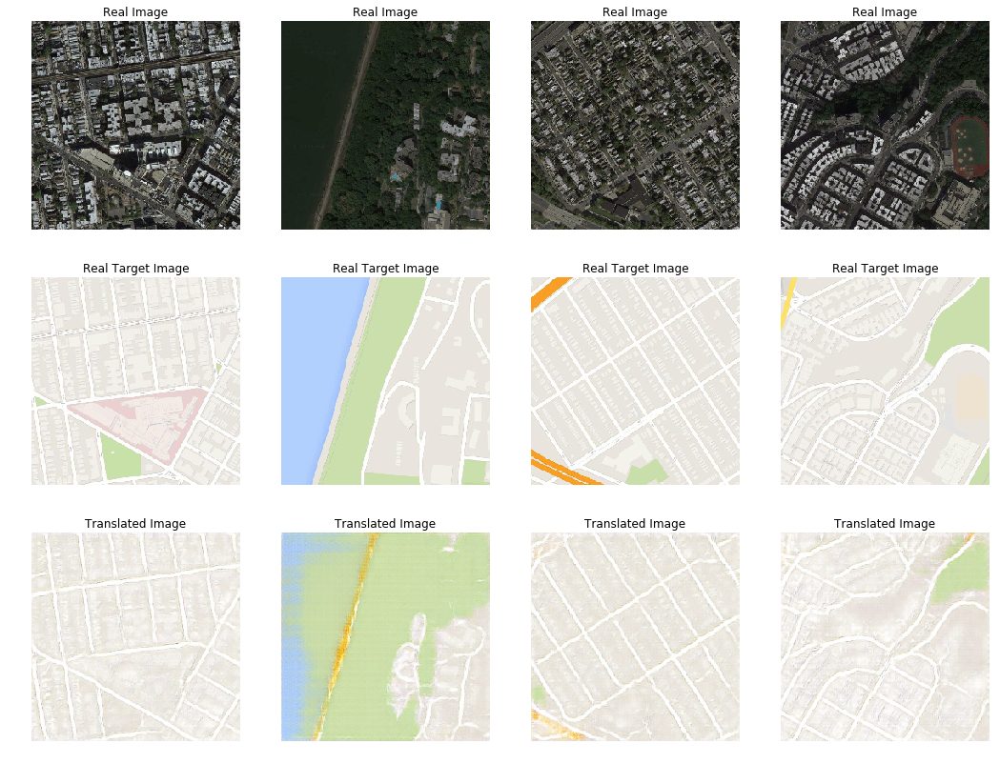

Epoch --> 20
Discriminator's Loss on Real: 0.0004 and Translated: 0.0005 Images
Generator's Loss: 11.9108


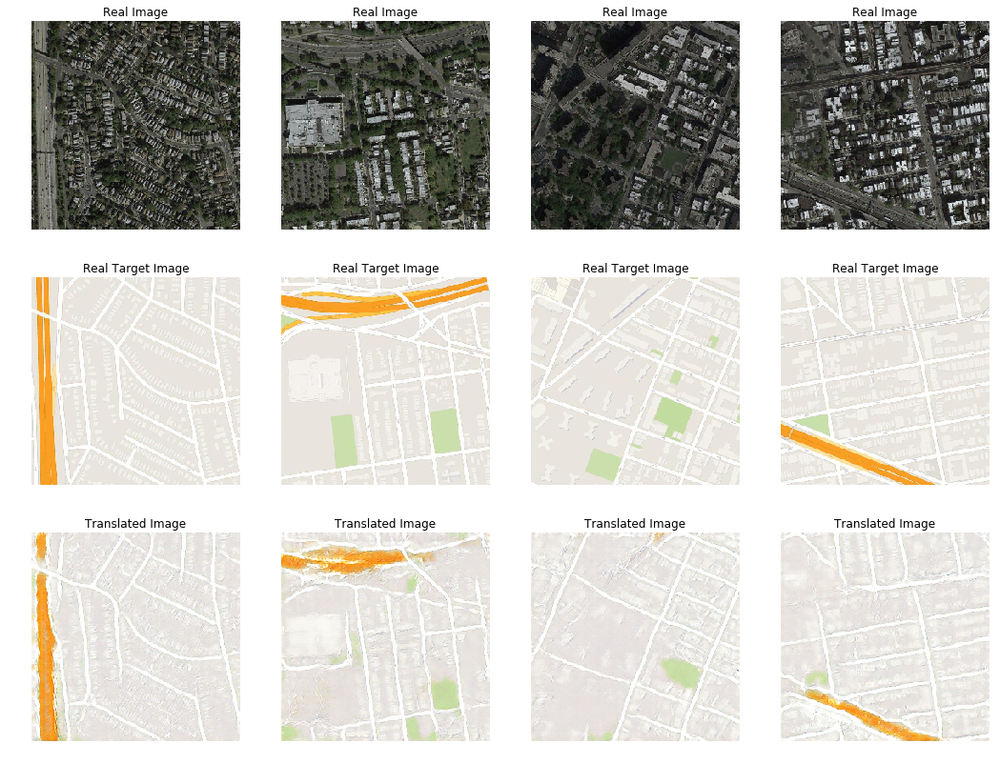

Epoch --> 30
Discriminator's Loss on Real: 0.0008 and Translated: 0.0011 Images
Generator's Loss: 15.4259


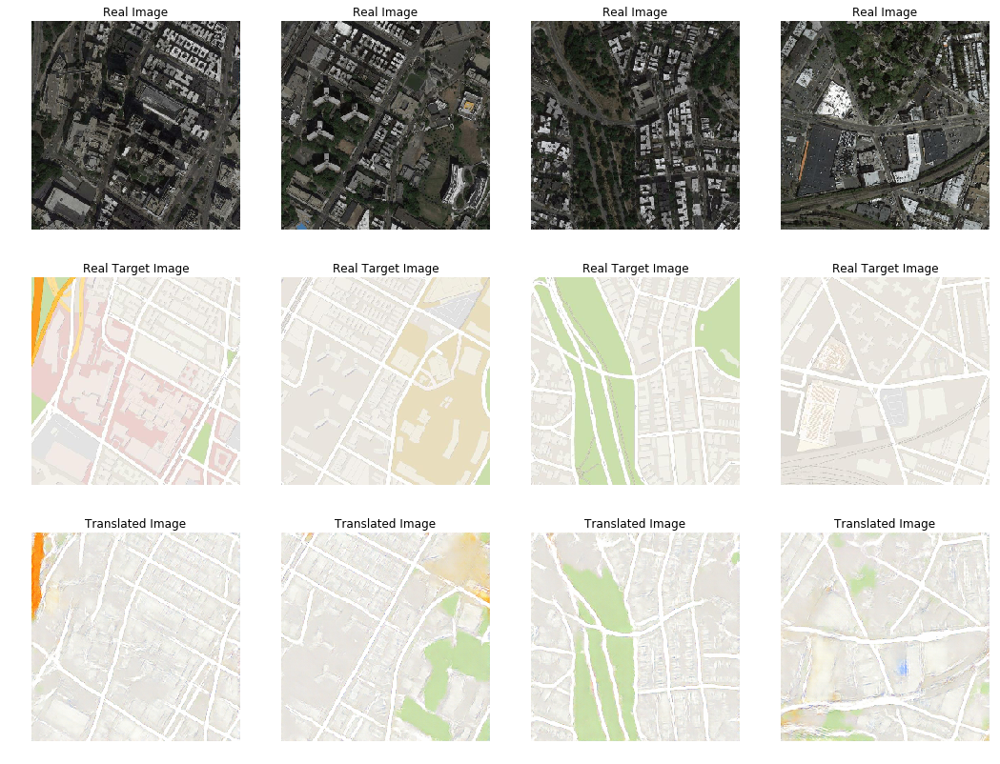

Epoch --> 40
Discriminator's Loss on Real: 0.0240 and Translated: 0.0328 Images
Generator's Loss: 9.6580


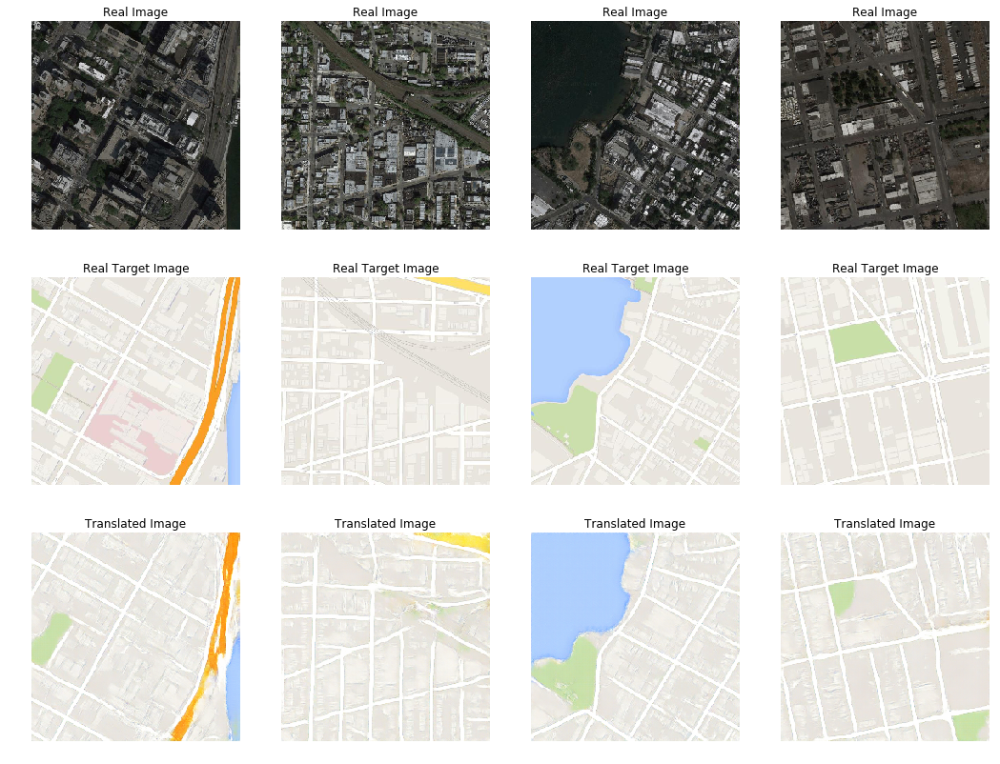

Epoch --> 50
Discriminator's Loss on Real: 0.0395 and Translated: 0.0162 Images
Generator's Loss: 11.8605


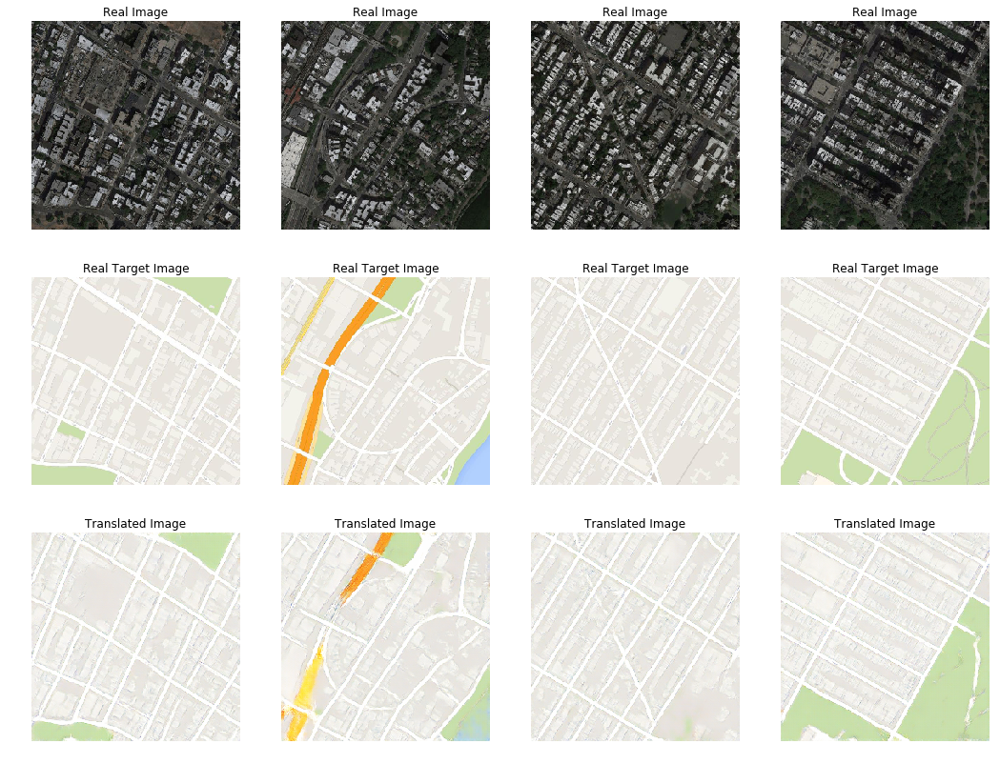

Epoch --> 60
Discriminator's Loss on Real: 0.0042 and Translated: 0.3421 Images
Generator's Loss: 10.9988


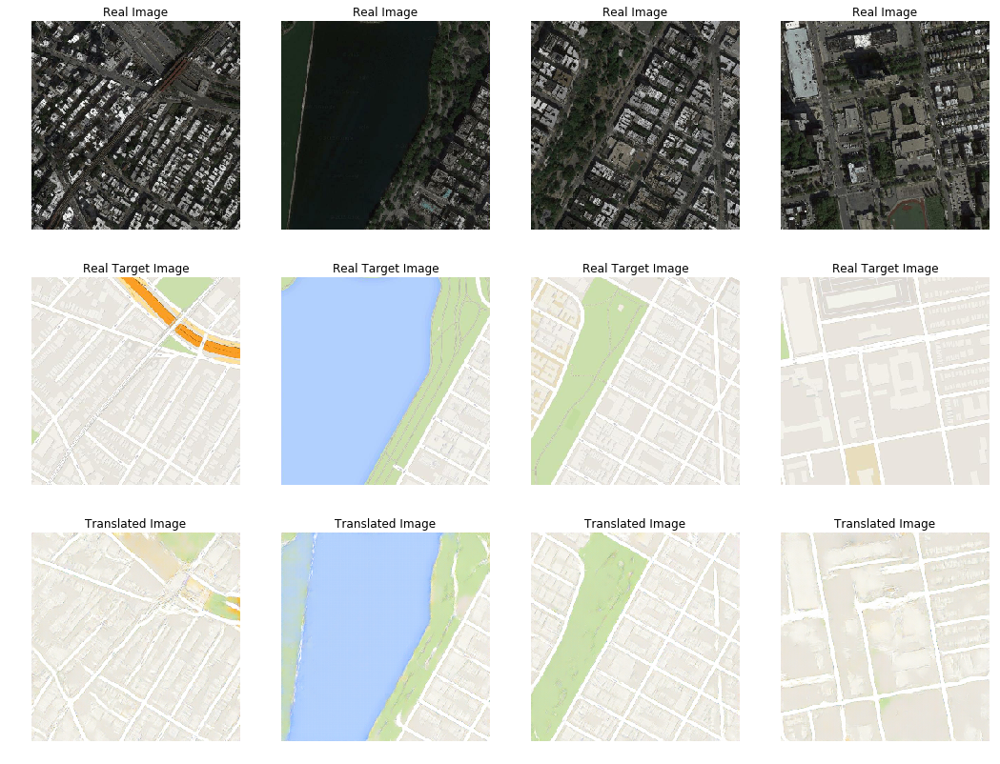

Epoch --> 70
Discriminator's Loss on Real: 0.0231 and Translated: 0.0038 Images
Generator's Loss: 11.1389


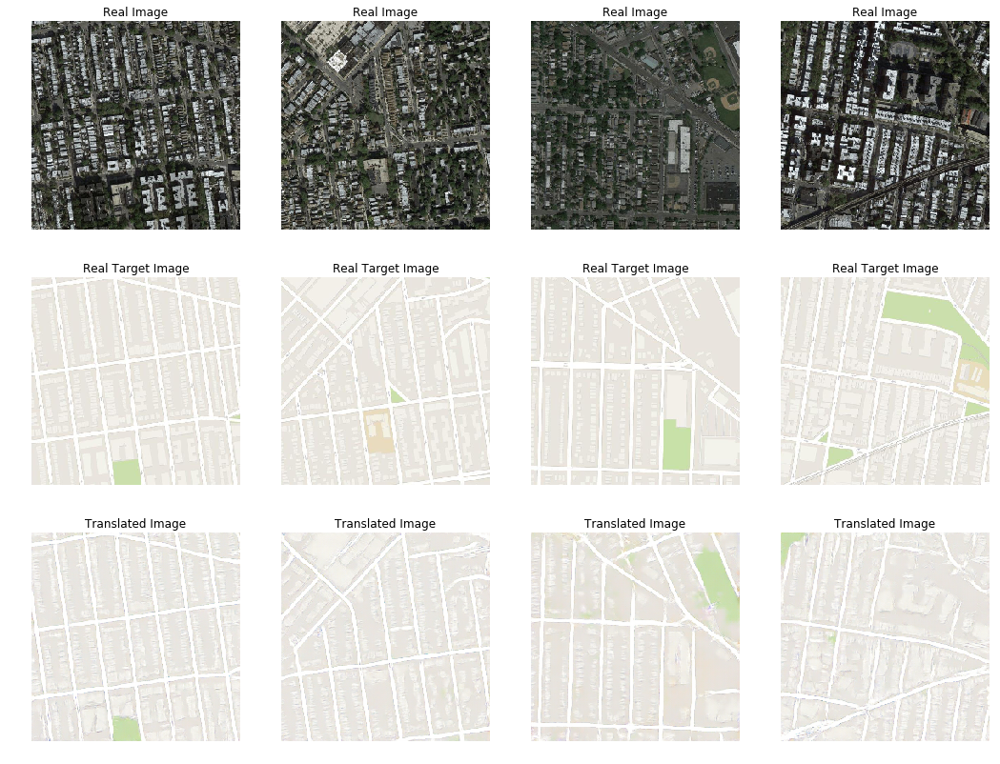

Epoch --> 80
Discriminator's Loss on Real: 0.1032 and Translated: 0.0265 Images
Generator's Loss: 13.4173


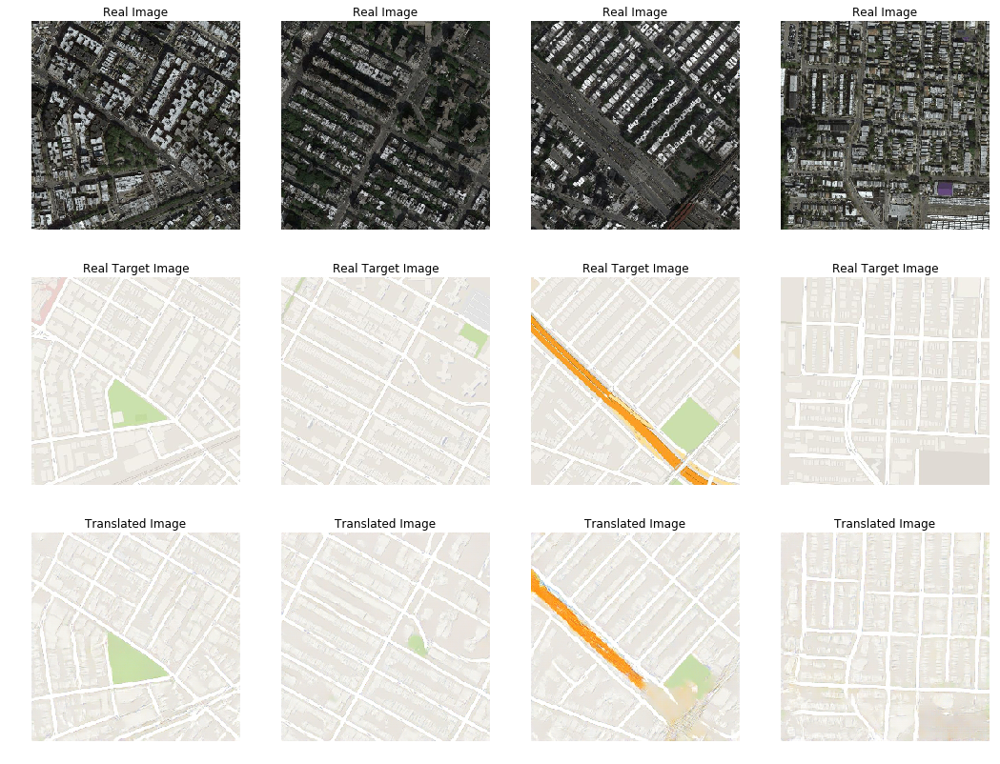

Epoch --> 90
Discriminator's Loss on Real: 0.2076 and Translated: 0.0254 Images
Generator's Loss: 8.7648


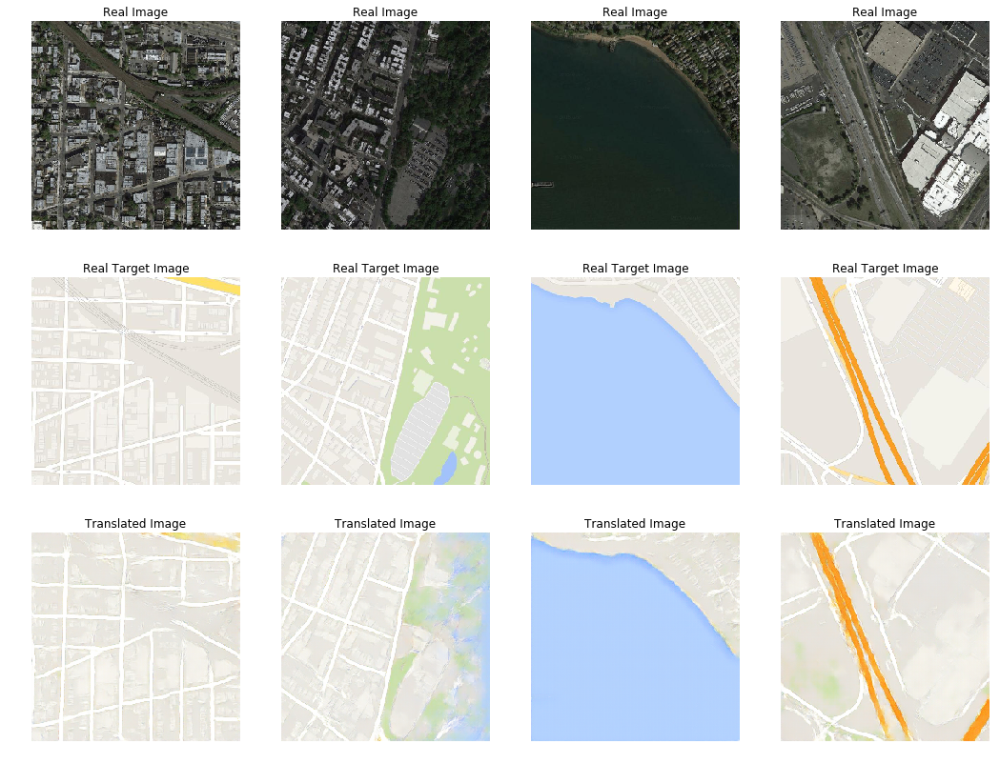

Epoch --> 100
Discriminator's Loss on Real: 0.2750 and Translated: 0.0893 Images
Generator's Loss: 10.3021


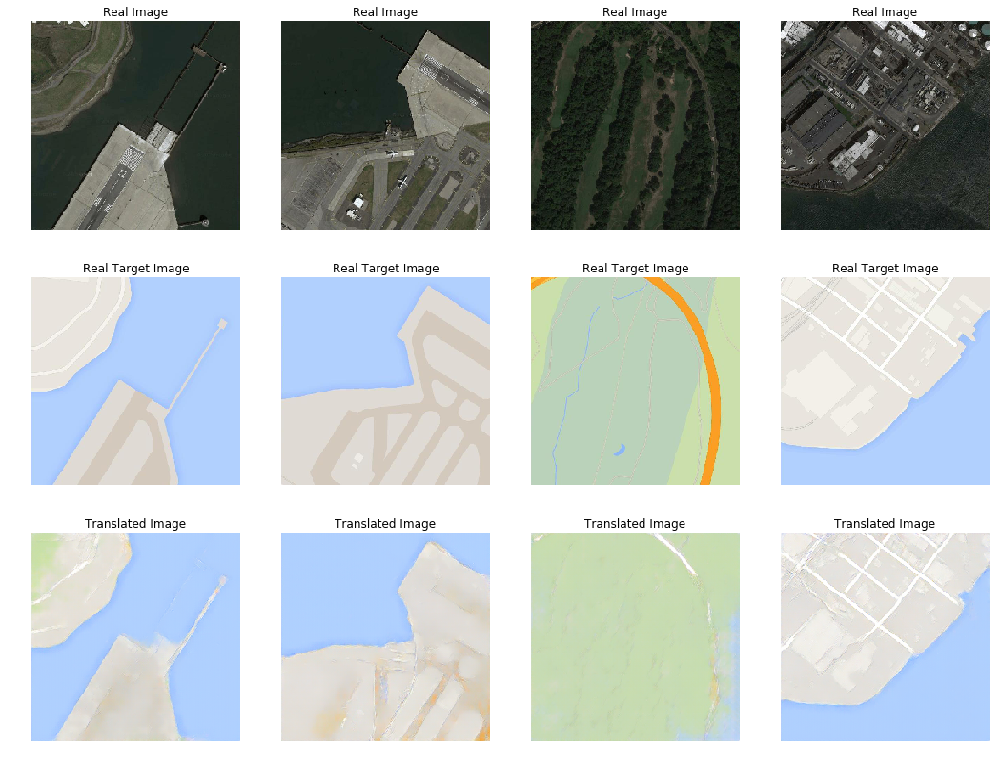

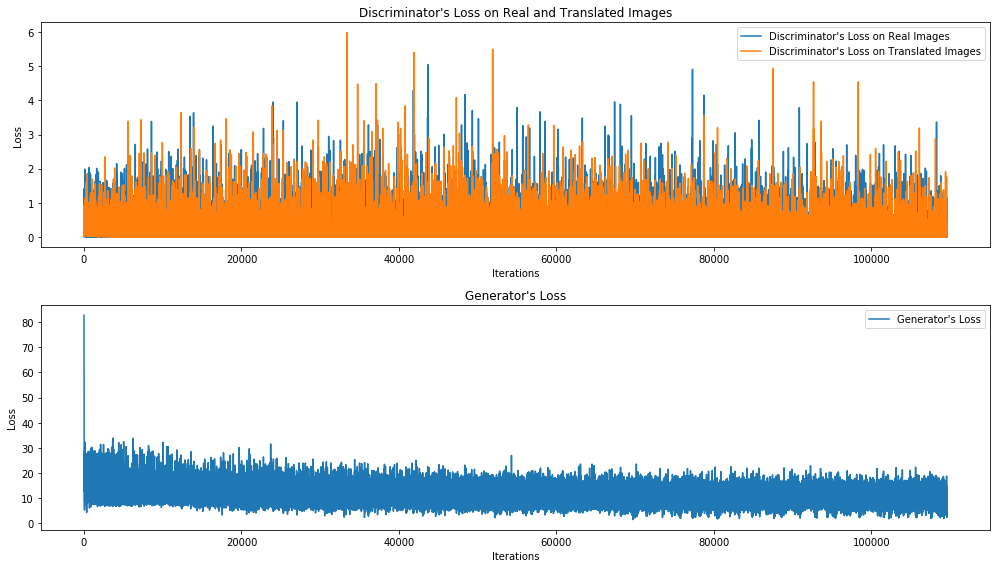

CPU times: user 5h 19min 25s, sys: 2h 30min 57s, total: 7h 50min 23s
Wall time: 8h 34min 59s


In [0]:
# calculate execution time
%%time
# number of epochs
n_epochs = 100
# load image dataset
dataset = load_real_images(src_images, tar_images)
# train GAN
train_gan(g_model, d_model, gan_model, dataset, n_epochs)

## Translate Images with Saved Pix2Pix Model

- Training the Pix2Pix model results in many saved models and samples of translated images. More training epochs does not necessarily mean a better quality model. Therefore, we can choose a model based on the quality of the translated images and use it to perform ad hoc image-to-image translation.

- We can use the same function named load_real_images( ) for loading the dataset as we used when training the model. In this case, we will load the model saved at the end of 100 epochs or 109,600 training iterations.

- Next, we can choose a random image pair from the training dataset to use as an example. We provide the source satellite image as input to the model and use it to predict a Google Map image. Finally, we can plot the source, target and translated images.

- In this case, we can see that the generated image captures large roads with orange highlight as well as green tree areas. The generated image is not perfect but is very close to the expected image.


Loaded Real Image : (1096, 256, 256, 3), Real Target : (1096, 256, 256, 3)


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:310: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


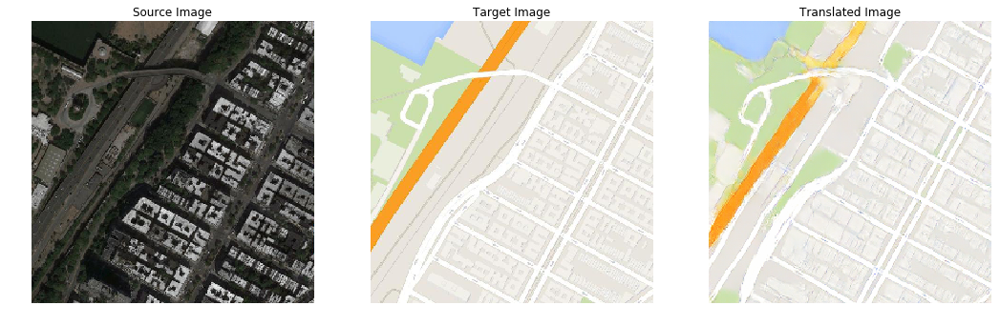

In [0]:
# plot source, target and translated images
def plot_Images(src_img, tar_img, gen_img):
    # vertically stack source, target and translated images
    images = vstack((src_img, tar_img, gen_img))
    # scale images from [-1,1] to [0,1]
    images = (images + 1) / 2.0
    # set titles
    titles = ['Source Image', 'Target Image', 'Translated Image']
    # set plot size
    plt.figure(figsize=(18,14))
    
    # plot images row by row
    for i in range(len(images)):
        # define subplot
        plt.subplot(1, 3, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(images[i])
        # show title
        plt.title(titles[i])
    plt.show()
    
# load image dataset
[real_image, real_target] = load_real_images(src_images, tar_images)
print(f'Loaded Real Image : {real_image.shape}, Real Target : {real_target.shape}')
      
# load model
model = load_model('p2pgan_generator_model_at_epoch_100.h5')

# select random example
ix = randint(0, len(real_image), 1)
src_img, tar_img = real_image[ix], real_target[ix]

# translated image from source image
gen_img = model.predict(src_img)

# plot all three images
plot_Images(src_img, tar_img, gen_img)

## Translate Google Maps to Satellite Images

- Now that we are familiar with how to develop and use a Pix2Pix model for translating satellite images to Google Maps Images, we can also explore the reverse, that is we can develop a Pix2Pix model to translate Google map images to plausible satellite images. This requires that the model invent or hallucinate plausible buildings, roads, parks and more.

- We can use the same code to train the model with one small difference. We can change the order of the datasets returned from the load_real_images( ) function. __Note the order of real_image and real_target images is reversed__. This means that the model will take Google map images as input and learn to generate satellite images.

- Run the example as before. The image quality will improve and will continue to vary over the training process. A final model can be chosen based on translated image quality, not total training epochs.

In [0]:
# load and prepare training images
def load_real_images(src_images, tar_images):
    # load compressed arrays
    #data = load(filename)
    # unpack arrays
    #real_image, real_target = data['arr_0'], data['arr_1']
    # scale images from [0,255] to [-1,1]
    real_image = (src_images - 127.5) / 127.5
    real_target = (tar_images - 127.5) / 127.5
    return [real_target, real_image]

## References
[Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/abs/1611.07004)

[Github link for Image-to-image translation with Conditional Adversarial Nets](https://github.com/phillipi/pix2pix) 

[Introduction to Pix2Pix GAN](https://machinelearningmastery.com/a-gentle-introduction-to-pix2pix-generative-adversarial-network/)

[How to Implement Pix2Pix GAN Models From Scratch With Keras](https://machinelearningmastery.com/how-to-implement-pix2pix-gan-models-from-scratch-with-keras/)

[How to Develop a Pix2Pix GAN for Image-to-Image Translation](https://machinelearningmastery.com/how-to-develop-a-pix2pix-gan-for-image-to-image-translation/)

[What Are L1 and L2 Loss Functions?](https://afteracademy.com/blog/what-are-l1-and-l2-loss-functions)